In [1]:
# !pip install python-levenshtein

In [1]:
# kernel auto reload modules when the underlying code is chaneged, instead of having to reset the runtime.
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('/root/class/cmu/DL/hw4p2')

# Libraries and Initial Processing

In [2]:
import os
import sys
import pandas as pd
import numpy as np
import Levenshtein as lev
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.utils.rnn as rnn_utils
from torch.utils.data import DataLoader, Dataset
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.nn.utils as utils
import seaborn as sns
import matplotlib.pyplot as plt
import time
import random
import datetime
from torch.utils import data
from torch.nn.utils.rnn import pad_sequence, pack_padded_sequence, pad_packed_sequence

from tqdm import tqdm

cuda = torch.cuda.is_available()

print(cuda, sys.version)

device = torch.device("cuda" if cuda else "cpu")
num_workers = 4 if cuda else 0
print("Cuda = "+str(cuda)+" with num_workers = "+str(num_workers))
np.random.seed(11785)
torch.manual_seed(11785)

# The labels of the dataset contain letters in LETTER_LIST.
# You should use this to convert the letters to the corresponding indices
# and train your model with numerical labels.
LETTER_LIST = ['<sos>', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', \
               'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', "'", ' ', '<eos>']

True 3.8.12 (default, Oct 12 2021, 13:49:34) 
[GCC 7.5.0]
Cuda = True with num_workers = 4


In [3]:
def create_dictionaries(letter_list):
    '''
    Create dictionaries for letter2index and index2letter transformations
    based on LETTER_LIST
    Args:
        letter_list: LETTER_LIST
    Return:
        letter2index: Dictionary mapping from letters to indices
        index2letter: Dictionary mapping from indices to letters
    '''
    letter2index = dict()
    index2letter = dict()
    
    # TODO
    for idx, letter in enumerate(letter_list):
        letter2index[letter] = idx
        index2letter[idx] = letter
    
    return letter2index, index2letter

def transform_index_to_letter(batch_indices):
    '''
    Transforms numerical index input to string output by converting each index 
    to its corresponding letter from LETTER_LIST

    Args:
        batch_indices: List of indices from LETTER_LIST with the shape of (N, )
        
    Return:
        transcripts: List of converted string transcripts. This would be a list with a length of N
    '''
    transcripts = []
    # TODO
        
    return transcripts
        
# Create the letter2index and index2letter dictionary
letter2index, index2letter = create_dictionaries(LETTER_LIST)

# Kaggle (TODO)

# Dataset and Dataloading (TODO)

You will need to implement the Dataset class by your own. You can implement it similar to HW3P2. However, you are welcomed to do it your own way if it is more comfortable or efficient.

Note that you need to use LETTER_LIST to convert the transcript into numerical labels for the model.


Example of raw transcript:

    ['<sos>', 'N', 'O', 'R', 'T', 'H', 'A', 'N', 'G', 'E', 'R', ' ','A', 'B', 'B', 'E', 'Y', '<eos>']

Example of converted transcript ready to process for the model:

    [0, 14, 15, 18, 20, 8, 1, 14, 7, 5, 18, 28, 1, 2, 2, 5, 25, 29]


In [4]:
import os
import random
import pandas as pd
import numpy as np
import torch
from torch.utils.data import Dataset
from torch.nn.utils.rnn import pad_sequence
import torchaudio.transforms as T
from src.datasets.augmentation import AddGaussianNoise
from audiomentations import SpecFrequencyMask


class LibriSamples(Dataset):

    def __init__(self, data_path, partition= "train", freq_mask=False, add_noise=False): # You can use partition to specify train or dev

        assert partition in ['train', 'dev']

        self.partition = partition
        self.freq_mask = SpecFrequencyMask(p=0.5) if freq_mask else None
        self.add_noise = AddGaussianNoise(p=0.5) if add_noise else None

        self.X_dir = os.path.join(data_path, f'{partition}/mfcc') 
        self.Y_dir = os.path.join(data_path, f'{partition}/transcript') 

        file_names = os.listdir(self.X_dir)

        self.X_files = [os.path.join(self.X_dir, f) for f in file_names] 
        self.Y_files = [os.path.join(self.Y_dir, f) for f in file_names] 

        self.LETTER_LIST = ['<sos>', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', \
                            'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', \
                            'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', "'", ' ', '<eos>']

        assert(len(self.X_files) == len(self.Y_files))

    def __len__(self):
        return len(self.X_files)

    def __getitem__(self, idx):
    
        X = np.load(self.X_files[idx]) 
        Y = np.load(self.Y_files[idx]) 

        # Cepstral Mean Normalization
        X = (X - X.mean(axis=0))/(X.std(axis=0)+1e-7)
        # torchaudio.transforms.SlidingWindowCmn(cmn_window: int = 600, min_cmn_window: int = 100, center: bool = False, norm_vars: bool = False)

        if self.freq_mask:
            X = self.freq_mask(X)

        if self.add_noise:
            X = self.add_noise(X)
        
        X = torch.from_numpy(X)
        Yy = torch.LongTensor([self.LETTER_LIST.index(yy) for yy in Y]) 

        return X, Yy
    
    def collate_fn(batch):

        batch_x = [x for x,y in batch]
        batch_y = [y for x,y in batch]

        batch_x_pad = pad_sequence(batch_x, batch_first=True) 
        lengths_x = [len(x) for x in batch_x] 

        batch_y_pad = pad_sequence(batch_y, batch_first=True) 
        lengths_y = [len(y) for y in batch_y] 

        return batch_x_pad, batch_y_pad, torch.tensor(lengths_x), torch.tensor(lengths_y)


class LibriSamplesTest(Dataset):

    def __init__(self, data_path, test_order):
        test_dir = os.path.join(data_path, 'test')
        test_order_df = pd.read_csv(os.path.join(test_dir, test_order))
        test_order_list = test_order_df.file.to_list() 
        test_data_path = os.path.join(test_dir, 'mfcc')
        self.X_files = [os.path.join(test_data_path, x) for x in test_order_list] 
    
    def __len__(self):
        return len(self.X_files)
    
    def __getitem__(self, idx):
        X = torch.from_numpy(np.load(self.X_files[idx]))
        # Cepstral Mean Normalization
        X = (X - X.mean(axis=0))/(X.std(axis=0)+1e-7)
        return X
    
    def collate_fn(batch):
        batch_x = [x for x in batch]
        batch_x_pad = pad_sequence(batch_x, batch_first=True) 
        lengths_x = [len(x) for x in batch_x] 

        return batch_x_pad, torch.tensor(lengths_x)

In [5]:
root = '/shared/youngkim/hw4p2_student_data/hw4p2_student_data'

from src.datasets.libri_datamodule import LibriDataModule

dm = LibriDataModule(
    data_dir = root,
    freq_mask = False,
    add_noise = False,
    batch_size = 2,
    num_workers = 4,
    pin_memory = True,
    verbose = False,
)

dm.prepare_data()
dm.setup(stage=None)

train_loader = dm.train_dataloader()
val_loader = dm.val_dataloader()
test_loader = dm.predict_dataloader()


print("Batch size: ", dm.batch_size)
print("Train dataset samples = {}, batches = {}".format(dm.data_train.__len__(), len(train_loader)))
print("Val dataset samples = {}, batches = {}".format(dm.data_val.__len__(), len(val_loader)))
print("Test dataset samples = {}, batches = {}".format(dm.data_test.__len__(), len(test_loader)))

Batch size:  2
Train dataset samples = 28539, batches = 14269
Val dataset samples = 2703, batches = 1352
Test dataset samples = 2620, batches = 1310


In [6]:
# test code for checking shapes
for data in train_loader:
    x, y, lx, ly = data
    print(x.shape, y.shape, lx.shape, len(ly))
    print(y[0]) # desired 
    break

torch.Size([2, 1761, 13]) torch.Size([2, 246]) torch.Size([2]) 2
tensor([ 0, 23,  8,  5, 18,  5, 28,  4, 15, 28, 25, 15, 21, 28,  3, 15, 13,  5,
        28,  6, 18, 15, 13, 28, 15,  8, 28, 20,  8,  9, 19, 28,  9, 19, 28, 20,
        15, 15, 28, 13, 21,  3,  8, 28, 13,  1,  4,  1, 13,  5, 28, 20,  8,  5,
        19,  5, 28,  1, 18,  5, 28, 13, 25, 28, 15, 18,  4,  5, 18, 19, 28,  5,
        24,  3, 21, 19,  5, 28, 13,  5, 28, 25, 15, 21, 18, 28, 14,  1, 13,  5,
        28, 20,  8,  5, 28,  2,  1, 18, 15, 14,  5, 19, 19, 28,  4,  1, 14,  7,
        12,  1, 18, 19, 28, 25, 15, 21, 28,  8,  1, 22,  5, 28, 19,  5,  5, 14,
        28, 13,  5, 28, 20, 23,  5, 14, 20, 25, 28, 20,  9, 13,  5, 19, 29,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,

In [7]:
len(x), len(lx)

(2, 2)

# Model (TODO)

In [88]:
pack_x = pack_padded_sequence(x, lx, batch_first=True)
pack_x[0].shape, pack_x[1].shape

(torch.Size([1291, 13]), torch.Size([850]))

In [20]:
type(x)

torch.Tensor

In [19]:
isinstance(pack_x, nn.utils.rnn.PackedSequence)

True

In [22]:
x.shape

torch.Size([2, 850, 13])

In [78]:
ex_x = torch.tensor(range(2*5*4)).reshape(2, 5, 4)
ex_x[1,3:,:] = 0
lx = torch.tensor([5, 3])
ex_x, lx

(tensor([[[ 0,  1,  2,  3],
          [ 4,  5,  6,  7],
          [ 8,  9, 10, 11],
          [12, 13, 14, 15],
          [16, 17, 18, 19]],
 
         [[20, 21, 22, 23],
          [24, 25, 26, 27],
          [28, 29, 30, 31],
          [ 0,  0,  0,  0],
          [ 0,  0,  0,  0]]]),
 tensor([5, 3]))

In [76]:
batch, len_seq, dim = ex_x.shape
chop_x = ex_x[:,:-1,:]
chop_x = chop_x.reshape(batch, len_seq//2, 2, dim)
chop_x.shape, chop_x

(torch.Size([2, 2, 2, 4]),
 tensor([[[[ 0,  1,  2,  3],
           [ 4,  5,  6,  7]],
 
          [[ 8,  9, 10, 11],
           [12, 13, 14, 15]]],
 
 
         [[[20, 21, 22, 23],
           [24, 25, 26, 27]],
 
          [[28, 29, 30, 31],
           [ 0,  0,  0,  0]]]]))

In [77]:
max_x = chop_x.max(dim=2, keepdim=True).values.squeeze(2)
max_x.shape, max_x

(torch.Size([2, 2, 4]),
 tensor([[[ 4,  5,  6,  7],
          [12, 13, 14, 15]],
 
         [[24, 25, 26, 27],
          [28, 29, 30, 31]]]))

In [79]:
lx = torch.div(lx, 2, rounding_mode='trunc')
lx

tensor([2, 1])

In [82]:
pack_x = pack_padded_sequence(max_x, lx)
pack_x[0]

tensor([[ 4,  5,  6,  7],
        [12, 13, 14, 15],
        [24, 25, 26, 27]])

In [97]:
rnn = nn.LSTM(
    input_size=13,
    hidden_size=26,
    num_layers=1,
    bidirectional=True,
)
out, hidden = rnn(pack_x)
out, lx = pad_packed_sequence(out, batch_first=True)
x.shape, out.shape

(torch.Size([2, 850, 13]), torch.Size([2, 850, 52]))

In [99]:
rnn = pBLSTM(
    input_size=13,
    hidden_size=26,
)
out, hidden = rnn(pack_x)
out, lx = pad_packed_sequence(out, batch_first=True)
x.shape, out.shape

(torch.Size([2, 850, 13]), torch.Size([2, 425, 52]))

In [101]:
hidden[0].shape, hidden[1].shape

(torch.Size([2, 2, 26]), torch.Size([2, 2, 26]))

In [7]:
class pBLSTM(nn.Module):
    '''
    Pyramidal BiLSTM
    Read paper and understand the concepts and then write your implementation here.

    At each step,
    1. Pad your input if it is packed
    2. Truncate the input length dimension by concatenating feature dimension
        (i)  How should you deal with odd/even length input? 
        (ii) How should you deal with input length array (x_lens) after truncating the input?
    3. Pack your input
    4. Pass it into LSTM layer

    To make our implementation modular, we pass 1 layer at a time.
    '''
    def __init__(self, input_size, hidden_size, last_layer=False):
        super(pBLSTM, self).__init__()
        self.blstm = nn.LSTM(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=1,
            bidirectional=True,
        )
        self.last_layer = last_layer

    def forward(self, x, lx=None):
        if isinstance(x, nn.utils.rnn.PackedSequence):
            x, lx = pad_packed_sequence(x, batch_first=True)
        elif isinstance(x, torch.Tensor):
            assert isinstance(lx, torch.Tensor)
            assert len(x) == len(lx)
        
        batch_size, seq_len, dim = x.shape
        
        if seq_len % 2 == 1:
            x = x[:,:-1,:]
        
        x = x.reshape([batch_size, seq_len//2, 2, dim])
        x = x.max(2, keepdim=True).values.squeeze(2)
        lx = torch.div(lx, 2, rounding_mode='trunc')

        x = pack_padded_sequence(x, lx.cpu(), enforce_sorted=False, batch_first=True)
        out, hidden = self.blstm(x)

        return (out, hidden) if self.last_layer else out

In [8]:
class Encoder(nn.Module):
    '''
    Encoder takes the utterances as inputs and returns the key, value and unpacked_x_len.

    '''
    def __init__(self, input_size, encoder_hidden_size, key_value_size=128):
        super(Encoder, self).__init__()
        # The first LSTM layer at the bottom
        self.lstm = nn.LSTM(
            input_size=input_size,
            hidden_size=encoder_hidden_size,
            num_layers=1,
            bidirectional=True,
        )

        # Define the blocks of pBLSTMs
        # Dimensions should be chosen carefully
        # Hint: Bidirectionality, truncation...
        self.pBLSTMs = nn.Sequential(
            pBLSTM(encoder_hidden_size*2, encoder_hidden_size),
            pBLSTM(encoder_hidden_size*2, encoder_hidden_size),
            pBLSTM(encoder_hidden_size*2, encoder_hidden_size, last_layer=True),
            # Optional: dropout
            # ...
        )
         
        # The linear transformations for producing Key and Value for attention
        # Hint: Dimensions when bidirectional lstm? 
        self.key_network = nn.Linear(encoder_hidden_size*2, key_value_size)
        self.value_network = nn.Linear(encoder_hidden_size*2, key_value_size)

    def forward(self, x, lx):
        """
        1. Pack your input and pass it through the first LSTM layer (no truncation)
        2. Pass it through the pyramidal LSTM layer
        3. Pad your input back to (B, T, *) or (T, B, *) shape
        4. Output Key, Value, and truncated input lens

        Key and value could be
            (i) Concatenated hidden vectors from all time steps (key == value).
            (ii) Linear projections of the output from the last pBLSTM network.
                If you choose this way, you can use the final output of
                your pBLSTM network.
        """

        x = pack_padded_sequence(x, lx.cpu(), batch_first=True, enforce_sorted=False)
        x, _ = self.lstm(x)

        x, (h, c) = self.pBLSTMs(x)
        x, lx = pad_packed_sequence(x, batch_first=True)

        k = self.key_network(x)
        v = self.value_network(x)

        return k, v, lx
        

In [214]:
x.shape, lx

(torch.Size([2, 1621, 13]), tensor([202,  36]))

In [213]:
encoder = Encoder(
    input_size=13,
    encoder_hidden_size=256,
    key_value_size=128
)
# Try out your encoder on a tiny input before moving to the next step...
k, v, lx = encoder(x, lx)
print(k.shape, v.shape, len(lx))

torch.Size([2, 202, 128]) torch.Size([2, 202, 128]) 2


In [164]:
lx.unsqueeze(1)

tensor([[106],
        [ 55]])

In [157]:
torch.arange(106)

tensor([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
         14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,
         28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
         42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  55,
         56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,  68,  69,
         70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,
         84,  85,  86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,
         98,  99, 100, 101, 102, 103, 104, 105])

In [16]:
def plot_attention(attention):
    # utility function for debugging
    plt.clf()
    sns.heatmap(attention, cmap='GnBu')
    plt.show()

class Attention(nn.Module):
    '''
    Attention is calculated using key and value from encoder and query from decoder.
    Here are different ways to compute attention and context:
    1. Dot-product attention
        energy = bmm(key, query) 
        # Optional: Scaled dot-product by normalizing with sqrt key dimension
        # Check "attention is all you need" Section 3.2.1
    * 1st way is what most TAs are comfortable with, but if you want to explore...
    2. Cosine attention
        energy = cosine(query, key) # almost the same as dot-product xD 
    3. Bi-linear attention
        W = Linear transformation (learnable parameter): d_k -> d_q
        energy = bmm(key @ W, query)
    4. Multi-layer perceptron
        # Check "Neural Machine Translation and Sequence-to-sequence Models: A Tutorial" Section 8.4
    
    After obtaining unnormalized attention weights (energy), compute and return attention and context, i.e.,
    energy = mask(energy) # mask out padded elements with big negative number (e.g. -1e9)
    attention = softmax(energy)
    context = bmm(attention, value)

    5. Multi-Head Attention
        # Check "attention is all you need" Section 3.2.2
        h = Number of heads
        W_Q, W_K, W_V: Weight matrix for Q, K, V (h of them in total)
        W_O: d_v -> d_v

        Reshape K: (B, T, d_k)
        to (B, T, h, d_k // h) and transpose to (B, h, T, d_k // h)
        Reshape V: (B, T, d_v)
        to (B, T, h, d_v // h) and transpose to (B, h, T, d_v // h)
        Reshape Q: (B, d_q)
        to (B, h, d_q // h)

        energy = Q @ K^T
        energy = mask(energy)
        attention = softmax(energy)
        multi_head = attention @ V
        multi_head = multi_head reshaped to (B, d_v)
        context = multi_head @ W_O
    '''
    def __init__(self):
        super(Attention, self).__init__()
        # Optional: dropout

    def forward(self, query, key, value, mask):
        """
        input:
            key: (batch_size, seq_len, d_k)
            value: (batch_size, seq_len, d_v)
            query: (batch_size, d_q)
        * Hint: d_k == d_v == d_q is often true if you use linear projections
        return:
            context: (batch_size, key_val_dim)
        """
        assert key.shape[2] == query.shape[1] # d_k == d_q
        query = query.unsqueeze(2) # b, d_q, 1
        energy = torch.bmm(key, query).squeeze() # b, seq_len
        masking_value = -1e9 if energy.dtype == torch.float32 else -1e4
        energy = energy.masked_fill(mask, masking_value) # mask out padded elements with big negative number (e.g. -1e9)
        attention = F.softmax(energy, dim=1).unsqueeze(1) # b, 1, seq_len
        context = torch.bmm(attention, value).squeeze() # b, d_v
        
        return context, attention
        # we return attention weights for plotting (for debugging)

In [176]:
y

tensor([[ 0, 20,  8,  5, 18,  5, 28, 23,  1, 19, 28, 14, 15, 28,  3, 15, 23,  1,
         18,  4, 12, 25, 28, 20, 18,  1,  9, 20, 15, 18, 28,  1, 13, 15, 14,  7,
         19, 20, 28, 21, 19, 28,  1, 12, 20,  8, 15, 21,  7,  8, 28, 23,  5, 28,
         23,  5, 18,  5, 28,  1, 12, 12, 28, 16, 15, 15, 18, 28,  2, 21, 20, 28,
          6,  5,  1, 18, 28,  8,  1,  4, 28,  9, 20, 19, 28,  5,  6,  6,  5,  3,
         20, 28,  1, 14,  4, 28, 15, 21, 18, 28, 14, 15,  3, 20, 21, 18, 14,  1,
         12, 28, 16, 18,  1, 14, 11, 19, 28, 23,  5, 18,  5, 28, 14, 15, 20, 28,
         18,  5, 14,  5, 23,  5,  4, 29],
        [ 0,  9, 28, 19,  8,  1, 12, 12, 28,  6,  9, 14,  4, 28, 13, 25, 28, 16,
         15, 18, 20, 13,  1, 14, 20,  5,  1, 21, 28,  9, 14, 28, 13, 25, 28, 18,
         15, 15, 13, 28, 25, 15, 21, 28, 19,  1,  9,  4, 28, 25,  5, 19, 28, 25,
          5, 19, 29,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0

In [179]:
y.shape

torch.Size([2, 134])

In [178]:
vocab_size = len(LETTER_LIST)
embed_dim = 256
embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=0)
char_embedding = embedding(y)
char_embedding.shape

torch.Size([2, 134, 256])

In [180]:
char_embedding[:,0,:]

tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

In [182]:
prediction = torch.full((2,), fill_value=0)
embedding(prediction)

tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

In [186]:
v[:,0,:].shape

torch.Size([2, 128])

In [35]:
class Decoder(nn.Module):
    '''
    As mentioned in a previous recitation, each forward call of decoder deals with just one time step.
    Thus we use LSTMCell instead of LSTM here.
    The output from the last LSTMCell can be used as a query for calculating attention.
    Methods like Gumble noise and teacher forcing can also be incorporated for improving the performance.
    '''
    def __init__(self, vocab_size, decoder_hidden_dim, embed_dim, key_value_size=128):
        super(Decoder, self).__init__()
        # Hint: Be careful with the padding_idx
        self.embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=0)
        # The number of cells is defined based on the paper
        self.lstm1 = nn.LSTMCell(embed_dim+key_value_size, decoder_hidden_dim)
        self.lstm2 = nn.LSTMCell(decoder_hidden_dim, key_value_size)
    
        self.attention = Attention()     
        self.vocab_size = vocab_size
        # Optional: Weight-tying
        self.character_prob = nn.Linear(key_value_size*2, vocab_size) #: d_v -> vocab_size
        self.key_value_size = key_value_size
        
        # Weight tying
        self.character_prob.weight = self.embedding.weight

    def forward(self, key, value, encoder_len, y=None, mode='train', teacher_forcing_rate=0.9):
        '''
        Args:
            key :(B, T, d_k) - Output of the Encoder (possibly from the Key projection layer)
            value: (B, T, d_v) - Output of the Encoder (possibly from the Value projection layer)
            y: (B, text_len) - Batch input of text with text_length
            mode: Train or eval mode for teacher forcing
        Return:
            predictions: the character perdiction probability 
        '''

        batch_size, key_seq_max_len, key_value_size = key.shape

        if mode == 'train':
            max_len =  y.shape[1]
            char_embeddings = self.embedding(y)
        else:
            max_len = 600

        # TODO: Create the attention mask here (outside the for loop rather than inside) to aviod repetition
        mask = torch.arange(key_seq_max_len) >= encoder_len.unsqueeze(1)
        mask = mask.to(device)
        
        predictions = []
        # This is the first input to the decoder
        # What should the fill_value be?
        prediction = torch.full((batch_size,), fill_value=0, device=device)
        # The length of hidden_states vector should depend on the number of LSTM Cells defined in init
        # The paper uses 2
        hidden_states = [None, None] 
        
        # TODO: Initialize the context
        context = value.new_zeros((batch_size, key_value_size))

        attention_plot = [] # this is for debugging

        teacher_forcing = np.random.rand() < teacher_forcing_rate

        for i in range(max_len):
            if mode == 'train':
                # TODO: Implement Teacher Forcing
                if teacher_forcing:
                    if i == 0:
                        # This is the first time step
                        # Hint: How did you initialize "prediction" variable above?
                        char_embed = char_embeddings[:, 0, :]
                    else:
                        # Otherwise, feed the label of the **previous** time step
                        char_embed = char_embeddings[:, i-1, :]
                else:
                    char_embed = self.embedding(torch.argmax(prediction, dim=1) if i > 0 else prediction)
            else:
                char_embed = self.embedding(torch.argmax(prediction, dim=1) if i > 0 else prediction)

            # what vectors should be concatenated as a context?
            y_context = torch.cat([char_embed, context], dim=1)
            # context and hidden states of lstm 1 from the previous time step should be fed
            hidden_states[0] = self.lstm1(y_context, hidden_states[0])

            # hidden states of lstm1 and hidden states of lstm2 from the previous time step should be fed
            hidden_states[1] = self.lstm2(hidden_states[0][0], hidden_states[1])
            # What then is the query?
            query = hidden_states[1][0]
            
            # Compute attention from the output of the second LSTM Cell
            context, attention = self.attention(query, key, value, mask)
            # We store the first attention of this batch for debugging
            attention_plot.append(attention[0][0].detach().cpu())
            
            # What should be concatenated as the output context?
            output_context = torch.cat([query, context], dim=1)
            prediction = self.character_prob(output_context)
            # store predictions
            predictions.append(prediction.unsqueeze(1))
        
        # Concatenate the attention and predictions to return
        attentions = torch.stack(attention_plot, dim=0)
        predictions = torch.cat(predictions, dim=1)
        return predictions, attentions

In [36]:
class Seq2Seq(nn.Module):
    '''
    We train an end-to-end sequence to sequence model comprising of Encoder and Decoder.
    This is simply a wrapper "model" for your encoder and decoder.
    '''
    def __init__(self, input_dim, vocab_size, encoder_hidden_dim, decoder_hidden_dim, embed_dim, key_value_size=128):
        super(Seq2Seq,self).__init__()
        self.encoder = Encoder(input_dim, encoder_hidden_dim, key_value_size)
        self.decoder = Decoder(vocab_size, decoder_hidden_dim, embed_dim, key_value_size)

    def forward(self, x, x_len, y=None, mode='train'):
        key, value, encoder_len = self.encoder(x, x_len)
        predictions, attentions = self.decoder(key, value, encoder_len, y=y, mode=mode)
        return predictions, attentions

In [37]:
model = Seq2Seq(input_dim=13, vocab_size=len(LETTER_LIST), encoder_hidden_dim=256, decoder_hidden_dim=512, embed_dim=256)

model = model.to(device)
# from torchsummaryX import summary
# summary(model.to(device), x.to(device), lx, y.to(device), 'train')
model

Seq2Seq(
  (encoder): Encoder(
    (lstm): LSTM(13, 256, bidirectional=True)
    (pBLSTMs): Sequential(
      (0): pBLSTM(
        (blstm): LSTM(512, 256, bidirectional=True)
      )
      (1): pBLSTM(
        (blstm): LSTM(512, 256, bidirectional=True)
      )
      (2): pBLSTM(
        (blstm): LSTM(512, 256, bidirectional=True)
      )
    )
    (key_network): Linear(in_features=512, out_features=128, bias=True)
    (value_network): Linear(in_features=512, out_features=128, bias=True)
  )
  (decoder): Decoder(
    (embedding): Embedding(30, 256, padding_idx=0)
    (lstm1): LSTMCell(384, 512)
    (lstm2): LSTMCell(512, 128)
    (attention): Attention()
    (character_prob): Linear(in_features=256, out_features=30, bias=True)
  )
)

# Training

In [38]:
optimizer = optim.Adam(model.parameters(), lr=2e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3)
criterion = nn.CrossEntropyLoss(reduction='none')
scaler = torch.cuda.amp.GradScaler()

In [39]:
# mask = torch.arange(y.shape[1]) < ly.unsqueeze(1)
# mask.shape

In [40]:
# torch.sum(mask)

In [41]:
# mask = torch.arange(y.size()[1])[None, :] < ly[:, None]
# mask.shape

In [ ]:
def train(model, train_loader, criterion, optimizer, mode, scaler):
    model.train()
    running_loss = 0
    
    # 0) Iterate through your data loader
    for i, (x, y, x_len, y_len) in enumerate(train_loader):
        
        # 1) Send the inputs to the device
        x, y = x.to(device), y.to(device)

        with torch.cuda.amp.autocast():
            # 2) Pass your inputs, and length of speech into the model.
            predictions, attentions = model(x, x_len, y, mode=mode)
            
            # 3) Generate a mask based on target length. This is to mark padded elements
            # so that we can exclude them from computing loss.
            # Ensure that the mask is on the device and is the correct shape.
            mask = torch.arange(y.shape[1]) < y_len.unsqueeze(1)
            mask = mask.to(device)
                
            # 4) Make sure you have the correct shape of predictions when putting into criterion
            predictions = predictions.reshape(-1, predictions.shape[2])
            y = y.reshape(-1)
            loss = criterion(predictions, y)
            # Use the mask you defined above to compute the average loss
            mask = mask.reshape(-1)
            masked_loss = torch.sum(loss*mask) / torch.sum(mask)

        running_loss += masked_loss.item()
        running_loss /= i + 1

        # 5) backprop
        optimizer.zero_grad()
        scaler.scale(masked_loss).backward() 
        scaler.step(optimizer)
        scaler.update()
        # Optional: Gradient clipping

        # When computing Levenshtein distance, make sure you truncate prediction/target

        # Optional: plot your attention for debugging
        # plot_attention(attentions)
        
def val(model, valid_loader):
    model.eval()
    pass

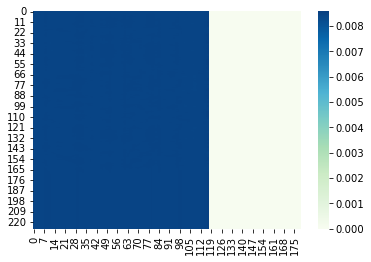

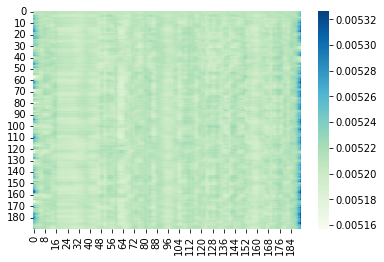

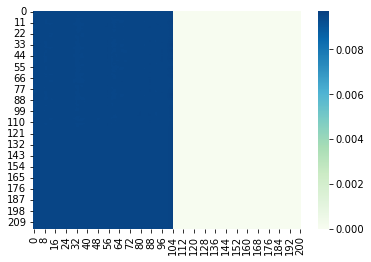

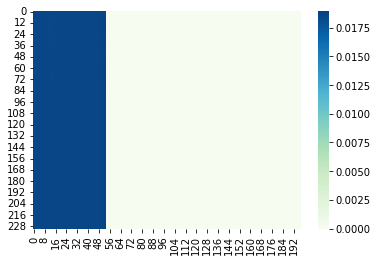

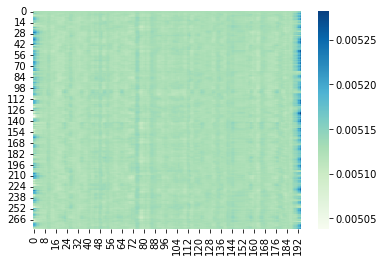

...

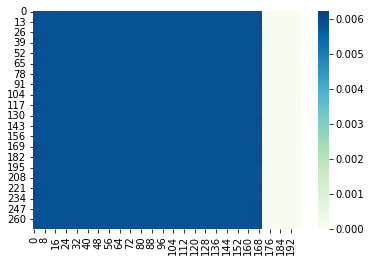

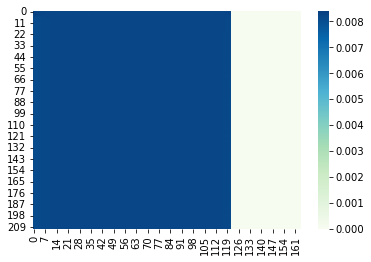

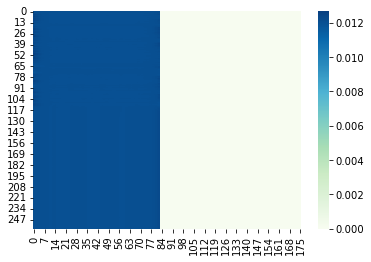

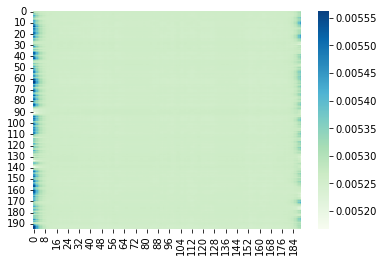

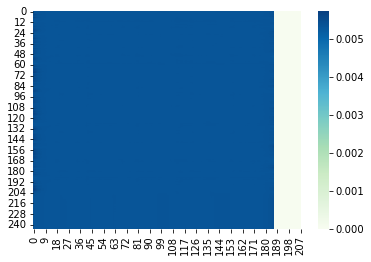

KeyboardInterrupt: 

In [43]:
train(model, train_loader, criterion, optimizer, 'train', scaler)

In [ ]:
# TODO: Define your model and put it on the device here
# ...

n_epochs = 10
optimizer = optim.Adam(model.parameters(), # fill this out)
# Make sure you understand the implication of setting reduction = 'none'
criterion = nn.CrossEntropyLoss(reduction='none')
mode = 'train'

for epoch in range(n_epochs):
    train(model, train_loader, criterion, optimizer, mode)
    val(model, valid_loader)

In [ ]:
'''
Debugging suggestions from Eason, a TA from previous semesters:

(1) Decrease your batch_size to 2 and print out the value and shape of all intermediate variables to check if they satisfy the expectation
(2) Be super careful about the LR, don't make it too high. Too large LR would lead to divergence and your attention plot will never make sense
(3) Make sure you have correctly handled the situation for time_step = 0 when teacher forcing

(1) is super important and is the most efficient way for debugging. 
'''
'''
Tips for passing A from B (from easy to hard):
** You need to implement all of these yourself without utilizing any library **
(1) Increase model capacity. E.g. increase num_layer of lstm
(2) LR and Teacher Forcing are also very important, you can tune them or their scheduler as well. Do NOT change lr or tf during the warm-up stage!
(3) Weight tying
(4) Locked Dropout - insert between the plstm layers
(5) Pre-training decoder or train an LM to help make predictions
(5) Pre-training decoder to speed up the convergence: 
    disable your encoder and only train the decoder like train a language model
(6) Better weight initialization technique
(7) Batch Norm between plstm. You definitely can try other positions as well
(8) Data Augmentation. Time-masking, frequency masking
(9) Weight smoothing (avg the last few epoch's weight)
(10) You can try CNN + Maxpooling (Avg). Some students replace the entire plstm blocks with it and some just combine them together.
(11) Beam Search
'''